# UFABC - ESTI019 - Codificação de Sinais Multimídia
<h2> Laboratório 6 - Seção de PDS da Voz </h2>
<h3> Prof. Mário Minami </h2>
<h2> OBJETIVOS: </h2>
<ol>
<li> Analisar arquivos de Áudio com dígitos, números gerais, texto lido e poesia </li>
<li> Leitura de Arquivos de Áudio e janelamento</li>
<li> Cálculo das Energias de Tempo Curto</li>
<li> Cálculo dos Espectrogramas</li>
<li> Determinação do Pitch, da Frequência Fundamental e das Formantes ($f_1$ a $f_4$) de Algumas Vogais</li>
<li>Determinação de fonemas surdos, sonoros, consoantes gerais e plosivos</li>
</ol>

## 1. Subir os arquivos de Áudio com dígitos, números gerais, texto lido e poesia

Suba os arquivos com:
<ul>
<li> Dígitos (pronunciados separadamente) </li>
<li> Números Gerais (p.ex. dia/mês/ano de nascimento, nº celular, RA)</li>
<li> Texto lido </li>
<li> Poesia declamada </li>
</ul>


## 2. Leitura de Arquivos de Áudio e janelamento

### 2.0 Importações

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display
from scipy import signal
import matplotlib.pyplot as plt
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)

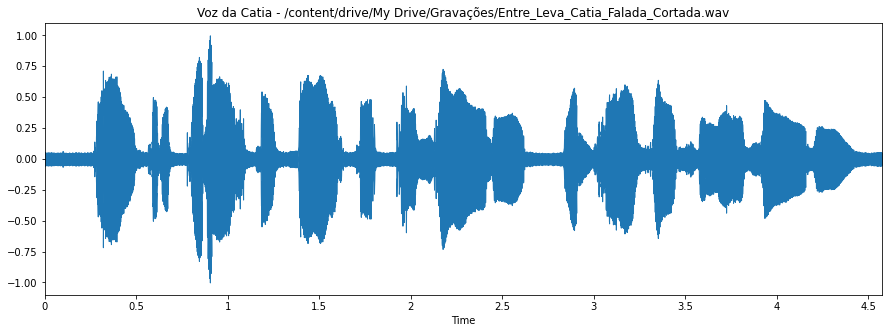

In [27]:
#OBS.: insira nome do arquivo WAV
audio1 = '/content/drive/My Drive/Gravações/Entre_Leva_Catia_Falada_Cortada.wav'
# print(audio1)
v1 , sr1 = librosa.load(audio1)
# print(type(v1), type(sr1))
# print(v1.shape, sr1)

fig, ax = plt.subplots(figsize=(15, 5))
librosa.display.waveplot(v1, sr=sr1)
plt.title('Voz da Catia - ' + audio1)
plt.plot()

IPython.display.Audio(data=v1, rate=sr1)

### 2.1 Definição dos Parâmetros da Análise 

In [8]:
print('Frequência de Amostragem', sr1)
fa = sr1

Frequência de Amostragem 22050


In [28]:
Ts = 0.04   # Tempo de duração do segmento em segundos
Nj = int(Ts*fa) # Número de pontos da Janela
print('Tamanho do Segmento: ', Nj)

Nseg = int(len(v1)/Nj)
Nover = int(Nj*0.5)
print('Número de Segmentos no Arquivo:', Nseg, '\nPontos Soprepostos:', Nover )

Tamanho do Segmento:  882
Número de Segmentos no Arquivo: 114 
Pontos Soprepostos: 441


### 2.2 Obtendo uma Janela de Hamming

Text(0.5, 1.0, 'Janela de Hamming')

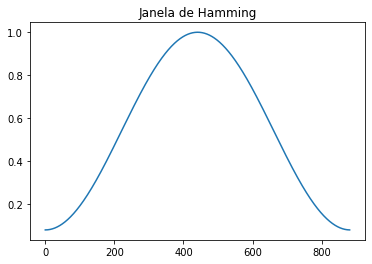

In [12]:
hm = signal.get_window('hamming', Nj)
plt.plot(hm); plt.title('Janela de Hamming')

# 3. Energia de Tempo Curto

## 3.1 Cálculo para arquivo de teste 

[]

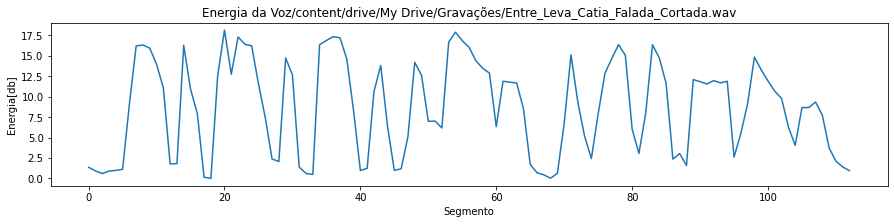

In [29]:
Nover = int(Nj*0.5)
Nseg = int(len(v1)/Nj)
E = []
for l in range(1, Nseg):
    xjan = v1[(l-1)*Nj+Nover:l*Nj+Nover]*hm
    x2 = list(np.array(xjan**2))
    aux = sum(x2)/Nj
    E.append(aux)
E = 10*np.log10(E)
Emin = np.min(E)  # calcula nível de ruído de fundo
plt.figure
fig, ax = plt.subplots(figsize=(15, 3))
plt.plot(E - Emin)
plt.title('Energia da Voz' + audio1)
plt.ylabel('Energia[db]'); plt.xlabel('Segmento')
plt.plot()

## 3.2 Agora leia os seus arquivos gravados e: 
**Determine o Contorno de Energia para três arquivos (todos os integrantes devem fazer a análise do gravaram):** 
1. *dígitos*
2. *voz falada*
3. *voz declamada (poema)*


### 3.2.1 Adinan

#### 3.2.1.1 Dígitos

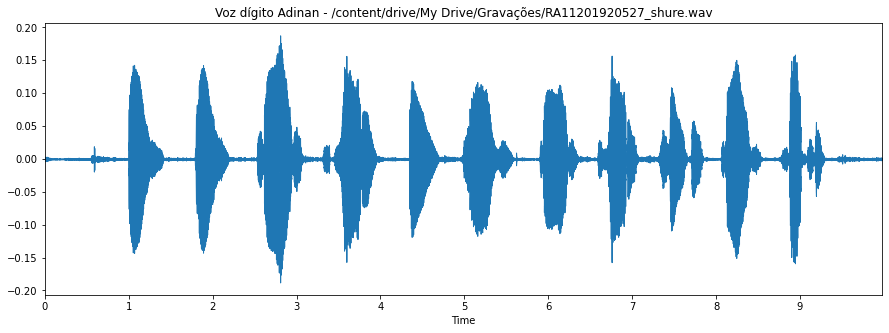

In [33]:
adinan_ra = '/content/drive/My Drive/Gravações/RA11201920527_shure.wav'
v1_adinan_ra , sr1_adinan_ra = librosa.load(adinan_ra)
v1_adinan_ra=v1_adinan_ra[0:220000]

fig, ax = plt.subplots(figsize=(15, 5))
librosa.display.waveplot(v1_adinan_ra, sr=sr1_adinan_ra)
plt.title('Voz dígito Adinan - ' + adinan_ra)
plt.show()

IPython.display.Audio(data=v1_adinan_ra, rate=sr1_adinan_ra)

Frequência de Amostragem 22050
Tamanho do Segmento 882
Número de Segmentos no Arquivo 249 
Pontos Soprepostos 441 




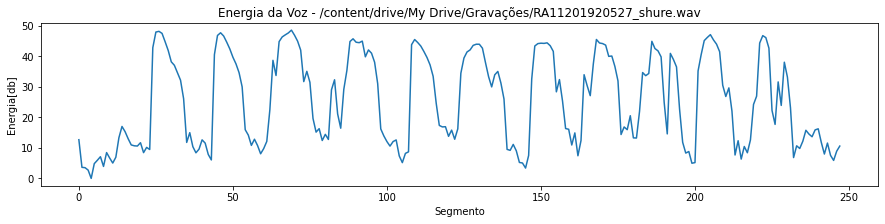

In [83]:
print('Frequência de Amostragem', sr1)
fa = sr1_adinan_ra

Ts = 0.04   # Tempo de duração do segmento em segundos
Nj = int(Ts*fa) # Número de pontos da Janela
print('Tamanho do Segmento', Nj)

Nover = int(Nj*0.5)
Nseg = int(len(v1_adinan_ra)/Nj)
print('Número de Segmentos no Arquivo', Nseg,'\nPontos Soprepostos', Nover, '\n\n' )

E = []
for l in range(1, Nseg):
    xjan = v1_adinan_ra[(l-1)*Nj+Nover:l*Nj+Nover]*hm
    x2 = list(np.array(xjan**2))
    aux = sum(x2)/Nj
    E.append(aux)
E = 10*np.log10(E)
Emin = np.min(E)  # calcula nível de ruído de fundo
plt.figure
fig, ax = plt.subplots(figsize=(15, 3))
plt.plot(E - Emin)
plt.title('Energia da Voz - ' + adinan_ra)
plt.ylabel('Energia[db]'); plt.xlabel('Segmento')
plt.show()

#### 3.2.1.2 Voz falada

<Figure size 432x288 with 0 Axes>

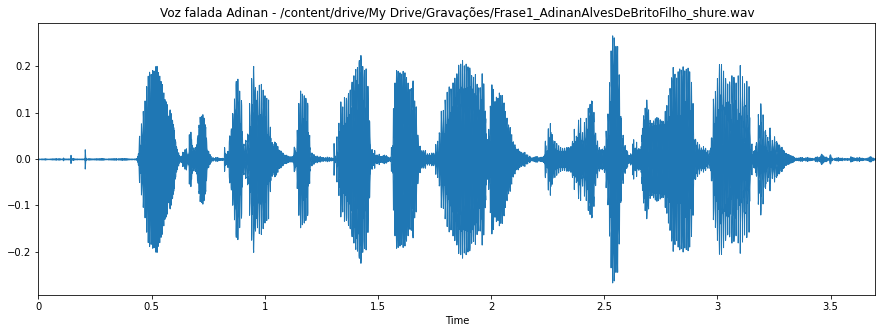

In [34]:
adinan_voz_falada = '/content/drive/My Drive/Gravações/Frase1_AdinanAlvesDeBritoFilho_shure.wav'
adinan_vf_s , adinan_vf_s_sr1 = librosa.load(adinan_voz_falada)
adinan_vf_s=adinan_vf_s[6615:88200]

plt.figure()
fig, ax = plt.subplots(figsize=(15, 5))
librosa.display.waveplot(adinan_vf_s, sr=adinan_vf_s_sr1)
plt.title('Voz falada Adinan - ' + adinan_voz_falada)
plt.show()

IPython.display.Audio(data=adinan_vf_s, rate=adinan_vf_s_sr1)

Frequência de Amostragem 22050
Tamanho do Segmento 882
Número de Segmentos no Arquivo 92 . Pontos Soprepostos 441


[]

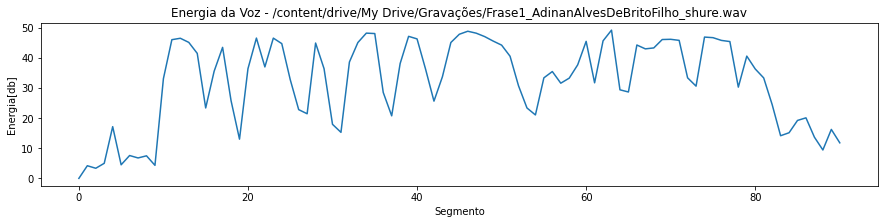

In [118]:
print('Frequência de Amostragem', adinan_vf_s_sr1)
fa = adinan_vf_s_sr1

Ts = 0.04   # Tempo de duração do segmento em segundos
Nj = int(Ts*fa) # Número de pontos da Janela
print('Tamanho do Segmento', Nj)

Nover = int(Nj*0.5)
Nseg = int(len(adinan_vf_s)/Nj)
print('Número de Segmentos no Arquivo', Nseg, '. Pontos Soprepostos', Nover )

E = []
for l in range(1, Nseg):
    xjan = adinan_vf_s[(l-1)*Nj+Nover:l*Nj+Nover]*hm
    x2 = list(np.array(xjan**2))
    aux = sum(x2)/Nj
    E.append(aux)
E = 10*np.log10(E)
Emin = np.min(E)  # calcula nível de ruído de fundo
plt.figure
fig, ax = plt.subplots(figsize=(15, 3))
plt.plot(E - Emin)
plt.title('Energia da Voz - ' + adinan_voz_falada)
plt.ylabel('Energia[db]'); plt.xlabel('Segmento')
plt.plot()

#### 3.2.1.3 Voz declamada

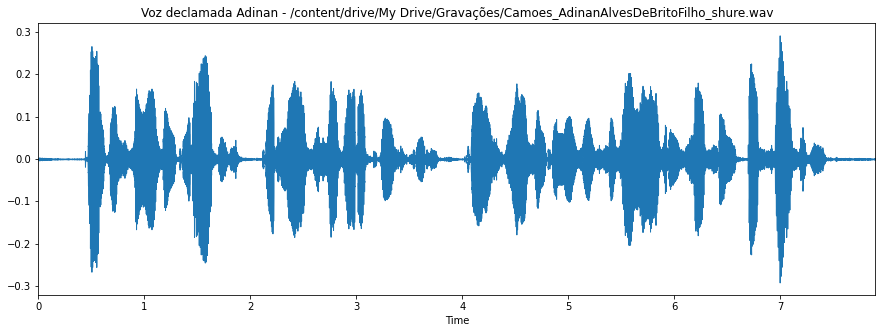

In [10]:
adinan_voz_declamada = '/content/drive/My Drive/Gravações/Camoes_AdinanAlvesDeBritoFilho_shure.wav'
adinan_vd_s , adinan_vd_s_sr1 = librosa.load(adinan_voz_declamada)
adinan_vd_s=adinan_vd_s[15435:189630]

fig, ax = plt.subplots(figsize=(15, 5))
librosa.display.waveplot(adinan_vd_s, sr=adinan_vd_s_sr1)
plt.title('Voz declamada Adinan - ' + adinan_voz_declamada)
plt.show()

IPython.display.Audio(data=adinan_vd_s, rate=adinan_vd_s_sr1)

Frequência de Amostragem: 22050
Tamanho do Segmento: 882
Número de Segmentos no Arquivo: 197 
Pontos Soprepostos: 441


[]

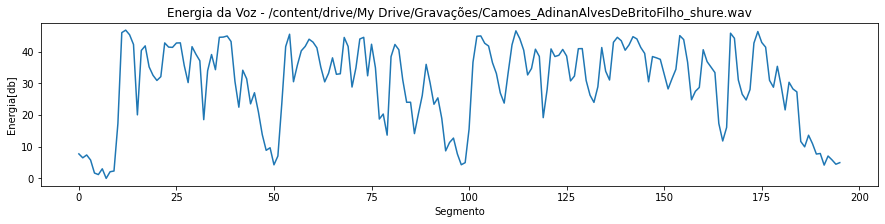

In [16]:
print('Frequência de Amostragem:', adinan_vd_s_sr1)
fa = adinan_vd_s_sr1

Ts = 0.04   # Tempo de duração do segmento em segundos
Nj = int(Ts*fa) # Número de pontos da Janela
print('Tamanho do Segmento:', Nj)

Nover = int(Nj*0.5)
Nseg = int(len(adinan_vd_s)/Nj)
print('Número de Segmentos no Arquivo:', Nseg, '\nPontos Soprepostos:', Nover )

E = []
for l in range(1, Nseg):
    xjan = adinan_vd_s[(l-1)*Nj+Nover:l*Nj+Nover]*hm
    x2 = list(np.array(xjan**2))
    aux = sum(x2)/Nj
    E.append(aux)
E = 10*np.log10(E)
Emin = np.min(E)  # calcula nível de ruído de fundo
plt.figure
fig, ax = plt.subplots(figsize=(15, 3))
plt.plot(E - Emin)
plt.title('Energia da Voz - ' + adinan_voz_declamada)
plt.ylabel('Energia[db]'); plt.xlabel('Segmento')
plt.plot()

### 3.2.2 João

#### 3.2.2.1 Dígitos

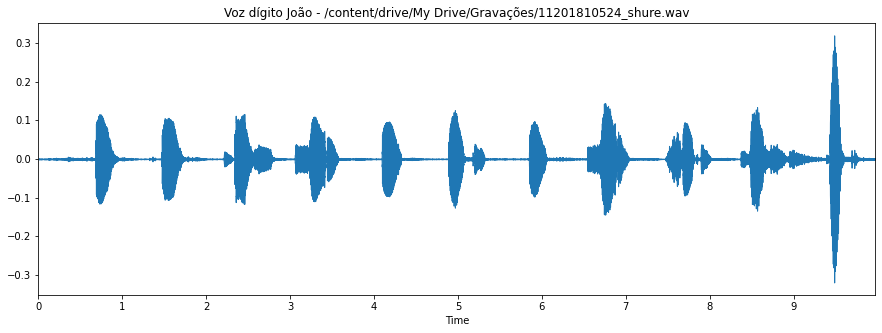

In [259]:
audio_joao_ra = '/content/drive/My Drive/Gravações/11201810524_shure.wav'
v1_joao_ra_behr , sr1_joao_ra_behr = librosa.load(audio_joao_ra)
v1_joao_ra_behr=v1_joao_ra_behr[1:220000]

fig, ax = plt.subplots(figsize=(15, 5))
librosa.display.waveplot(v1_joao_ra_behr, sr=sr1_joao_ra_behr)
plt.title('Voz dígito João - ' + audio_joao_ra)
plt.show()

IPython.display.Audio(data=v1_joao_ra_behr, rate=sr1_joao_ra_behr)

Frequência de Amostragem 22050
Tamanho do Segmento 882
Número de Segmentos no Arquivo 249 
Pontos Soprepostos 441 




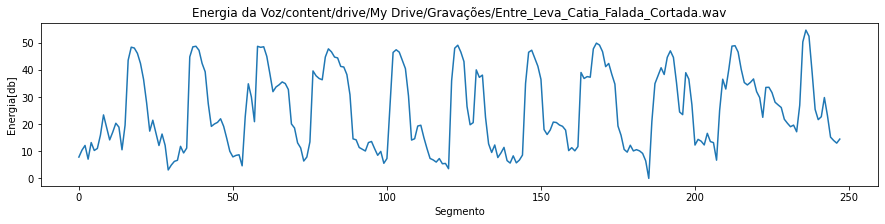

In [260]:
print('Frequência de Amostragem', sr1)
fa = sr1_joao_ra_behr

Ts = 0.04   # Tempo de duração do segmento em segundos
Nj = int(Ts*fa) # Número de pontos da Janela
print('Tamanho do Segmento', Nj)

Nover = int(Nj*0.5)
Nseg = int(len(v1_joao_ra_behr)/Nj)
print('Número de Segmentos no Arquivo', Nseg,'\nPontos Soprepostos', Nover, '\n\n' )

E = []
for l in range(1, Nseg):
    xjan = v1_joao_ra_behr[(l-1)*Nj+Nover:l*Nj+Nover]*hm
    x2 = list(np.array(xjan**2))
    aux = sum(x2)/Nj
    E.append(aux)
E = 10*np.log10(E)
Emin = np.min(E)  # calcula nível de ruído de fundo
plt.figure
fig, ax = plt.subplots(figsize=(15, 3))
plt.plot(E - Emin)
plt.title('Energia da Voz' + audio1)
plt.ylabel('Energia[db]'); plt.xlabel('Segmento')
plt.show()

#### 3.2.2.2 Voz falada

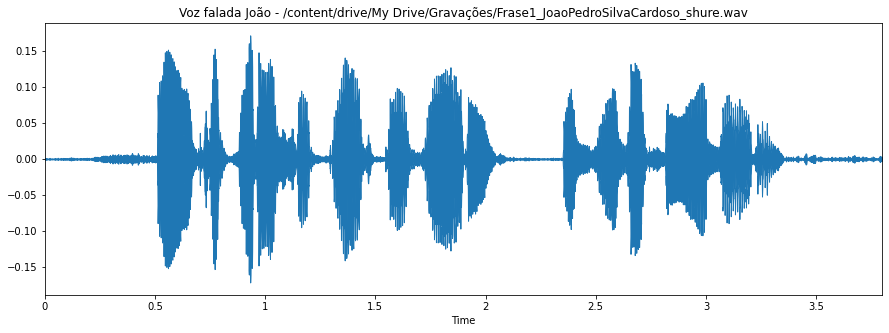

In [268]:
joao_voz_falada = '/content/drive/My Drive/Gravações/Frase1_JoaoPedroSilvaCardoso_shure.wav'
joao_vf_s , joao_vf_s_sr1 = librosa.load(joao_voz_falada)
joao_vf_s=joao_vf_s[4410:88200]

fig, ax = plt.subplots(figsize=(15, 5))
librosa.display.waveplot(joao_vf_s, sr=joao_vf_s_sr1)
plt.title('Voz falada João - ' + joao_voz_falada)
plt.show()

IPython.display.Audio(data=joao_vf_s, rate=joao_vf_s_sr1)

Frequência de Amostragem 22050
Tamanho do Segmento 882
Número de Segmentos no Arquivo 95 . Pontos Soprepostos 441


[]

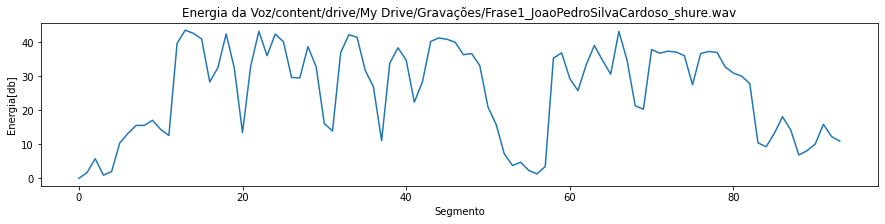

In [269]:
print('Frequência de Amostragem', joao_vf_s_sr1)
fa = joao_vf_s_sr1

Ts = 0.04   # Tempo de duração do segmento em segundos
Nj = int(Ts*fa) # Número de pontos da Janela
print('Tamanho do Segmento', Nj)

Nover = int(Nj*0.5)
Nseg = int(len(joao_vf_s)/Nj)
print('Número de Segmentos no Arquivo', Nseg, '. Pontos Soprepostos', Nover )

E = []
for l in range(1, Nseg):
    xjan = joao_vf_s[(l-1)*Nj+Nover:l*Nj+Nover]*hm
    x2 = list(np.array(xjan**2))
    aux = sum(x2)/Nj
    E.append(aux)
E = 10*np.log10(E)
Emin = np.min(E)  # calcula nível de ruído de fundo
plt.figure
fig, ax = plt.subplots(figsize=(15, 3))
plt.plot(E - Emin)
plt.title('Energia da Voz' + joao_voz_falada)
plt.ylabel('Energia[db]'); plt.xlabel('Segmento')
plt.plot()

#### 3.2.2.3 Voz declamada

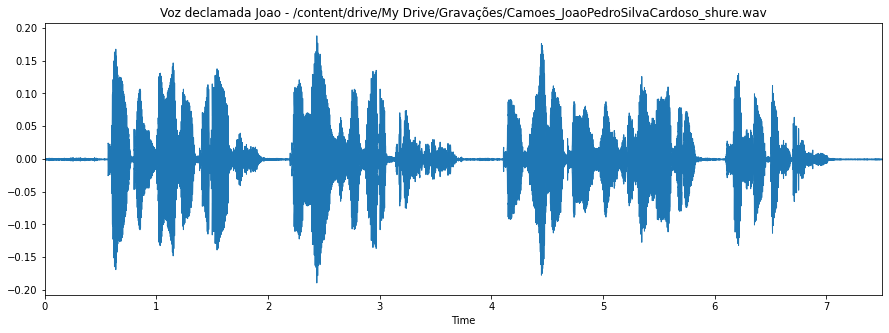

In [40]:
Joao_voz_declamada = '/content/drive/My Drive/Gravações/Camoes_JoaoPedroSilvaCardoso_shure.wav'
Joao_vd_s , Joao_vd_s_sr1 = librosa.load(Joao_voz_declamada)
Joao_vd_s=Joao_vd_s[0:165375]

fig, ax = plt.subplots(figsize=(15, 5))
librosa.display.waveplot(Joao_vd_s, sr=Joao_vd_s_sr1)
plt.title('Voz declamada Joao - ' + Joao_voz_declamada)
plt.show()

IPython.display.Audio(data=Joao_vd_s, rate=Joao_vd_s_sr1)

Frequência de Amostragem: 22050
Tamanho do Segmento: 882
Número de Segmentos no Arquivo: 187 
Pontos Soprepostos: 441


[]

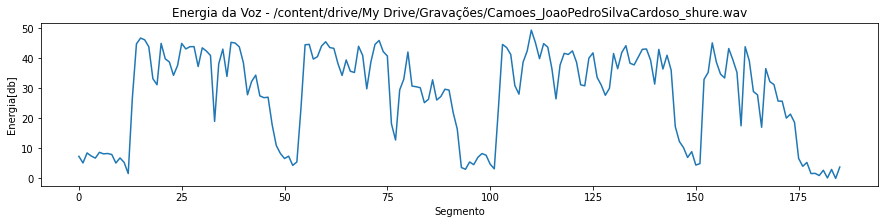

In [41]:
print('Frequência de Amostragem:', Joao_vd_s_sr1)
fa = Joao_vd_s_sr1

Ts = 0.04   # Tempo de duração do segmento em segundos
Nj = int(Ts*fa) # Número de pontos da Janela
print('Tamanho do Segmento:', Nj)

Nover = int(Nj*0.5)
Nseg = int(len(Joao_vd_s)/Nj)
print('Número de Segmentos no Arquivo:', Nseg, '\nPontos Soprepostos:', Nover )

E = []
for l in range(1, Nseg):
    xjan = Joao_vd_s[(l-1)*Nj+Nover:l*Nj+Nover]*hm
    x2 = list(np.array(xjan**2))
    aux = sum(x2)/Nj
    E.append(aux)
E = 10*np.log10(E)
Emin = np.min(E)  # calcula nível de ruído de fundo
plt.figure
fig, ax = plt.subplots(figsize=(15, 3))
plt.plot(E - Emin)
plt.title('Energia da Voz - ' + Joao_voz_declamada)
plt.ylabel('Energia[db]'); plt.xlabel('Segmento')
plt.plot()

### 3.2.3 Marcelo

#### 3.2.3.1 Dígitos

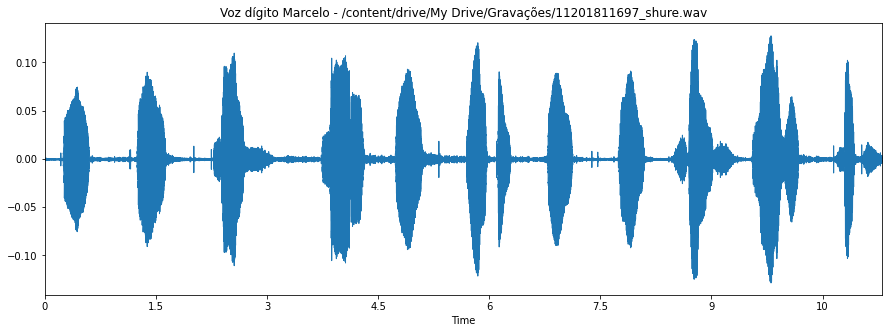

In [303]:
audio_marcelo_ra = '/content/drive/My Drive/Gravações/11201811697_shure.wav'
v1_marcelo_ra_behr , sr1_marcelo_ra_behr = librosa.load(audio_marcelo_ra)
corte = int(22050*12.3)
v1_marcelo_ra_behr=v1_marcelo_ra_behr[22050:corte]

fig, ax = plt.subplots(figsize=(15, 5))
librosa.display.waveplot(v1_marcelo_ra_behr, sr=sr1_marcelo_ra_behr)
plt.title('Voz dígito Marcelo - ' + audio_marcelo_ra)
plt.show()

IPython.display.Audio(data=v1_marcelo_ra_behr, rate=sr1_marcelo_ra_behr)

Frequência de Amostragem 22050
Tamanho do Segmento 882
Número de Segmentos no Arquivo 282 
Pontos Soprepostos 441 




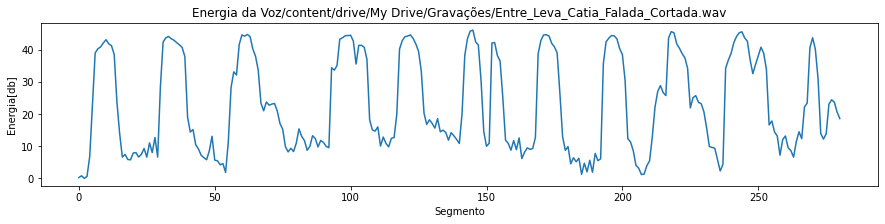

In [142]:
print('Frequência de Amostragem', sr1)
fa = sr1_marcelo_ra_behr

Ts = 0.04   # Tempo de duração do segmento em segundos
Nj = int(Ts*fa) # Número de pontos da Janela
print('Tamanho do Segmento', Nj)

Nover = int(Nj*0.5)
Nseg = int(len(v1_marcelo_ra_behr)/Nj)
print('Número de Segmentos no Arquivo', Nseg,'\nPontos Soprepostos', Nover, '\n\n' )

E = []
for l in range(1, Nseg):
    xjan = v1_marcelo_ra_behr[(l-1)*Nj+Nover:l*Nj+Nover]*hm
    x2 = list(np.array(xjan**2))
    aux = sum(x2)/Nj
    E.append(aux)
E = 10*np.log10(E)
Emin = np.min(E)  # calcula nível de ruído de fundo
plt.figure
fig, ax = plt.subplots(figsize=(15, 3))
plt.plot(E - Emin)
plt.title('Energia da Voz' + audio1)
plt.ylabel('Energia[db]'); plt.xlabel('Segmento')
plt.show()

#### 3.2.3.2 Voz falada

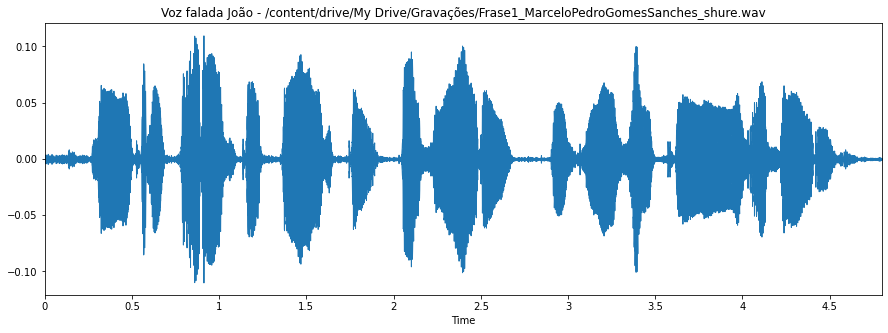

In [149]:
marcelo_voz_falada = '/content/drive/My Drive/Gravações/Frase1_MarceloPedroGomesSanches_shure.wav'
marcelo_vf_s , marcelo_vf_s_sr1 = librosa.load(marcelo_voz_falada)
corte = int(22050*5.8)
marcelo_vf_s=marcelo_vf_s[22050:corte]

fig, ax = plt.subplots(figsize=(15, 5))
librosa.display.waveplot(marcelo_vf_s, sr=marcelo_vf_s_sr1)
plt.title('Voz falada Marcelo - ' + marcelo_voz_falada)
plt.show()

IPython.display.Audio(data=marcelo_vf_s, rate=marcelo_vf_s_sr1)

Frequência de Amostragem 22050
Tamanho do Segmento 882
Número de Segmentos no Arquivo 120 . Pontos Soprepostos 441


[]

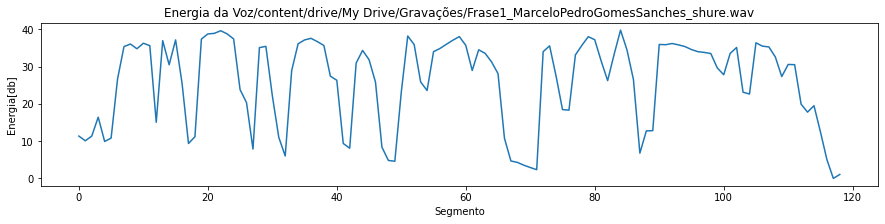

In [150]:
print('Frequência de Amostragem', marcelo_vf_s_sr1)
fa = marcelo_vf_s_sr1

Ts = 0.04   # Tempo de duração do segmento em segundos
Nj = int(Ts*fa) # Número de pontos da Janela
print('Tamanho do Segmento', Nj)

Nover = int(Nj*0.5)
Nseg = int(len(marcelo_vf_s)/Nj)
print('Número de Segmentos no Arquivo', Nseg, '. Pontos Soprepostos', Nover )

E = []
for l in range(1, Nseg):
    xjan = marcelo_vf_s[(l-1)*Nj+Nover:l*Nj+Nover]*hm
    x2 = list(np.array(xjan**2))
    aux = sum(x2)/Nj
    E.append(aux)
E = 10*np.log10(E)
Emin = np.min(E)  # calcula nível de ruído de fundo
plt.figure
fig, ax = plt.subplots(figsize=(15, 3))
plt.plot(E - Emin)
plt.title('Energia da Voz' + marcelo_voz_falada)
plt.ylabel('Energia[db]'); plt.xlabel('Segmento')
plt.plot()

#### 3.2.3.3 Voz declamada

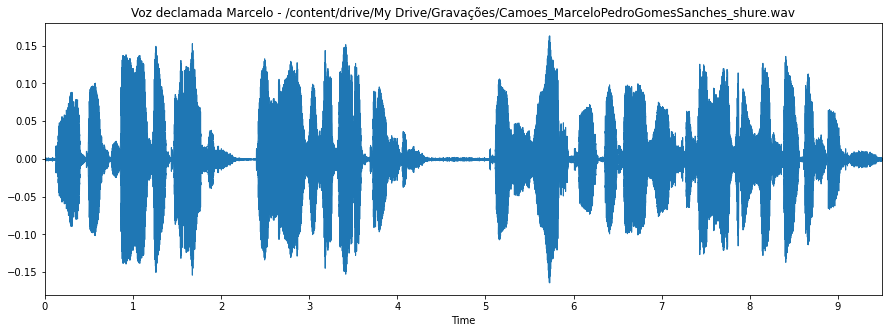

In [158]:
marcelo_voz_declamada = '/content/drive/My Drive/Gravações/Camoes_MarceloPedroGomesSanches_shure.wav'
marcelo_vd_s , marcelo_vd_s_sr1 = librosa.load(marcelo_voz_declamada)
corte = int(22050*10.5)
marcelo_vd_s=marcelo_vd_s[22050:corte]

fig, ax = plt.subplots(figsize=(15, 5))
librosa.display.waveplot(marcelo_vd_s, sr=marcelo_vd_s_sr1)
plt.title('Voz declamada Marcelo - ' + marcelo_voz_declamada)
plt.show()

IPython.display.Audio(data=marcelo_vd_s, rate=marcelo_vd_s_sr1)

Frequência de Amostragem: 22050
Tamanho do Segmento: 882
Número de Segmentos no Arquivo: 237 
Pontos Soprepostos: 441


[]

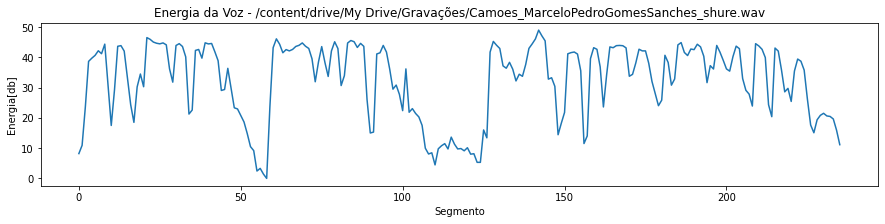

In [159]:
print('Frequência de Amostragem:', marcelo_vd_s_sr1)
fa = marcelo_vd_s_sr1

Ts = 0.04   # Tempo de duração do segmento em segundos
Nj = int(Ts*fa) # Número de pontos da Janela
print('Tamanho do Segmento:', Nj)

Nover = int(Nj*0.5)
Nseg = int(len(marcelo_vd_s)/Nj)
print('Número de Segmentos no Arquivo:', Nseg, '\nPontos Soprepostos:', Nover )

E = []
for l in range(1, Nseg):
    xjan = marcelo_vd_s[(l-1)*Nj+Nover:l*Nj+Nover]*hm
    x2 = list(np.array(xjan**2))
    aux = sum(x2)/Nj
    E.append(aux)
E = 10*np.log10(E)
Emin = np.min(E)  # calcula nível de ruído de fundo
plt.figure
fig, ax = plt.subplots(figsize=(15, 3))
plt.plot(E - Emin)
plt.title('Energia da Voz - ' + marcelo_voz_declamada)
plt.ylabel('Energia[db]'); plt.xlabel('Segmento')
plt.plot()

# 4. Espectrogramas

## 4.1 Visualização do Espectrograma para Arquivo de Teste

[]

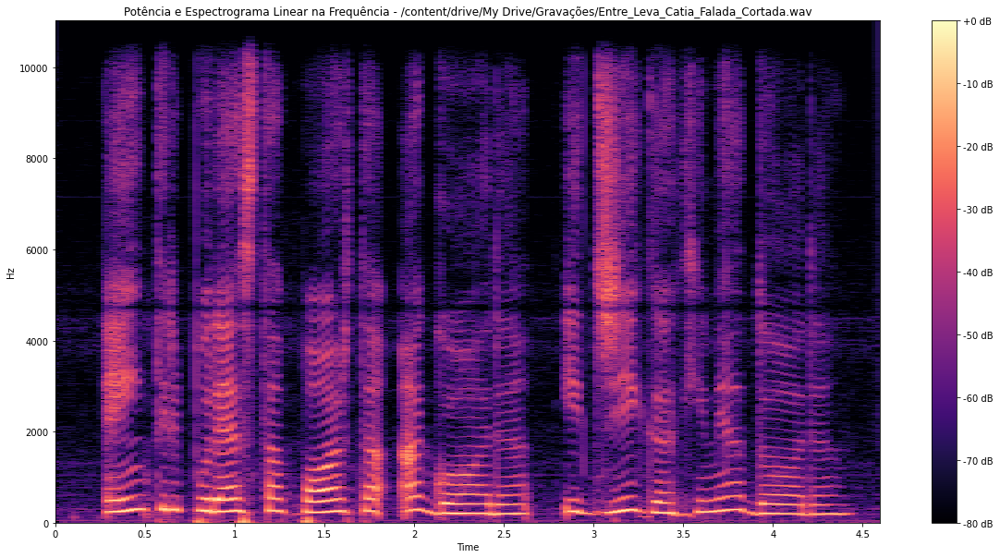

In [32]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(v1)), ref=np.max)
fig, ax = plt.subplots(figsize=(20, 10))
librosa.display.specshow(D, x_axis='time',y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Potência e Espectrograma Linear na Frequência - '+ audio1)
plt.plot()

## 4.2 Agora com os seus arquivos
**Faça os espectrogramas para os arquivos que vocês gravaram (todos novamente):**
<ul>
<li> Dígitos </li>
<li> Texto Lido </li>
<li> Poesia </li>
</ul>

### 4.2.1 Adinan

#### 4.2.1.1 Dígito

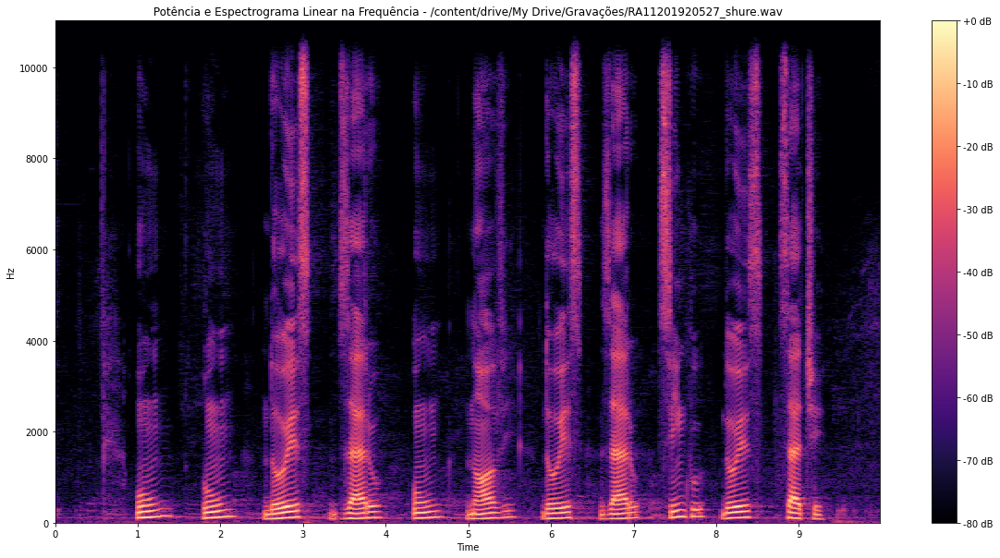

In [94]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(v1_adinan_ra)), ref=np.max)
fig, ax = plt.subplots(figsize=(20, 10))
librosa.display.specshow(D, x_axis='time',y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Potência e Espectrograma Linear na Frequência - '+ adinan_ra)
plt.show()

#### 4.2.1.2 Voz falada

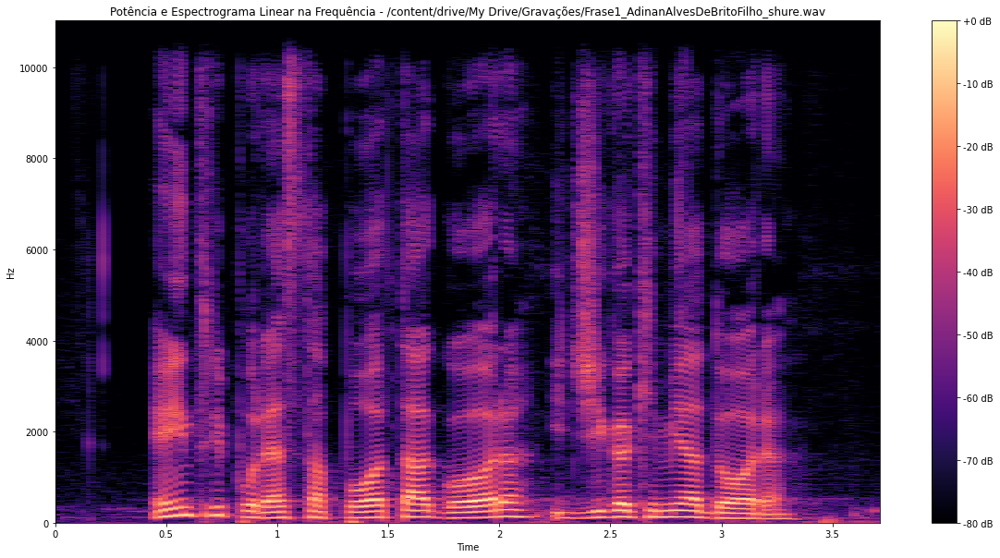

In [38]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(adinan_vf_s)), ref=np.max)
fig, ax = plt.subplots(figsize=(20, 10))
librosa.display.specshow(D, x_axis='time',y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Potência e Espectrograma Linear na Frequência - '+ adinan_voz_falada)
plt.show()

#### 4.2.1.3 Voz declamada

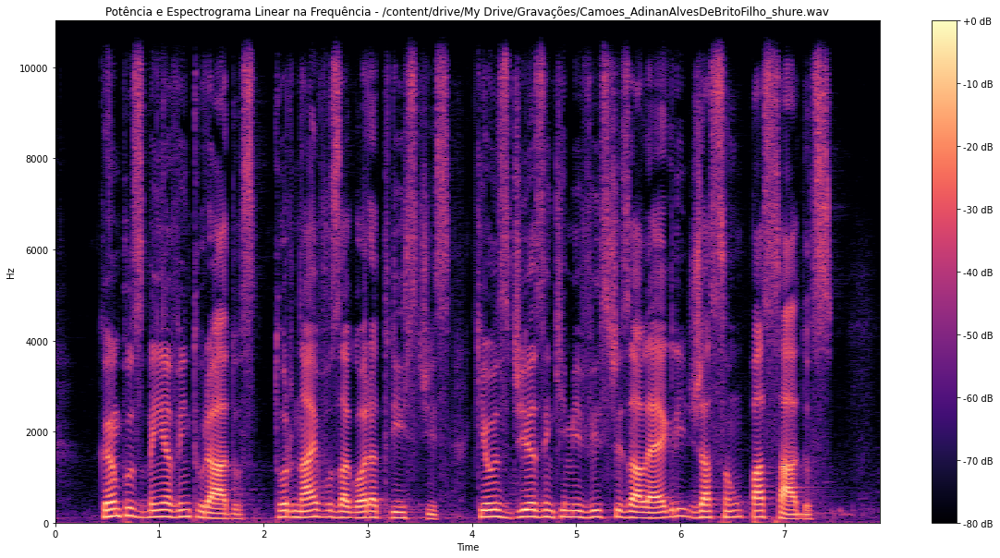

In [35]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(adinan_vd_s)), ref=np.max)
fig, ax = plt.subplots(figsize=(20, 10))
librosa.display.specshow(D, x_axis='time',y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Potência e Espectrograma Linear na Frequência - '+ adinan_voz_declamada)
plt.show()

### 4.2.2 João

#### 4.2.2.1 Dígito

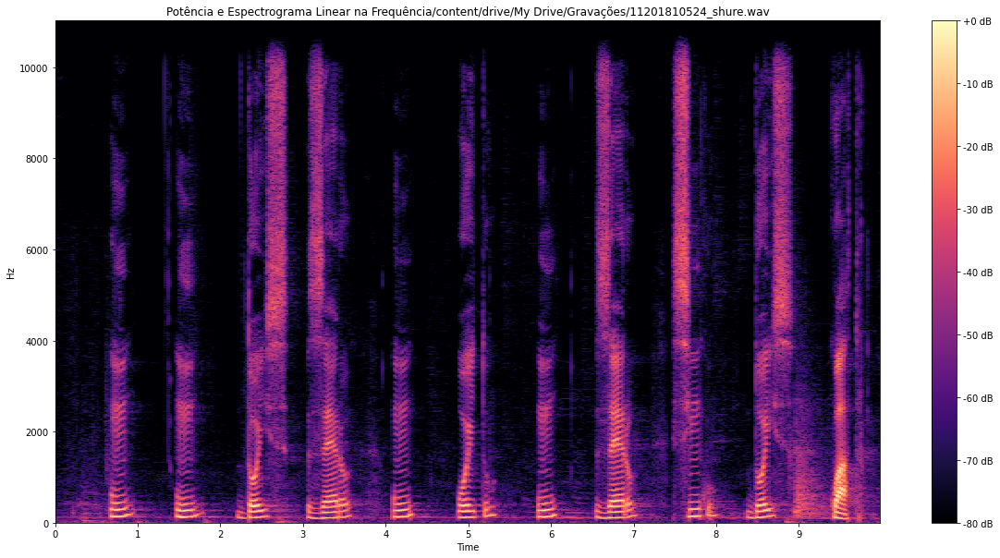

In [261]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(v1_joao_ra_behr)), ref=np.max)
fig, ax = plt.subplots(figsize=(20, 10))
librosa.display.specshow(D, x_axis='time',y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Potência e Espectrograma Linear na Frequência'+ audio_joao_ra)
plt.show()

#### 4.2.2.2 Voz falada

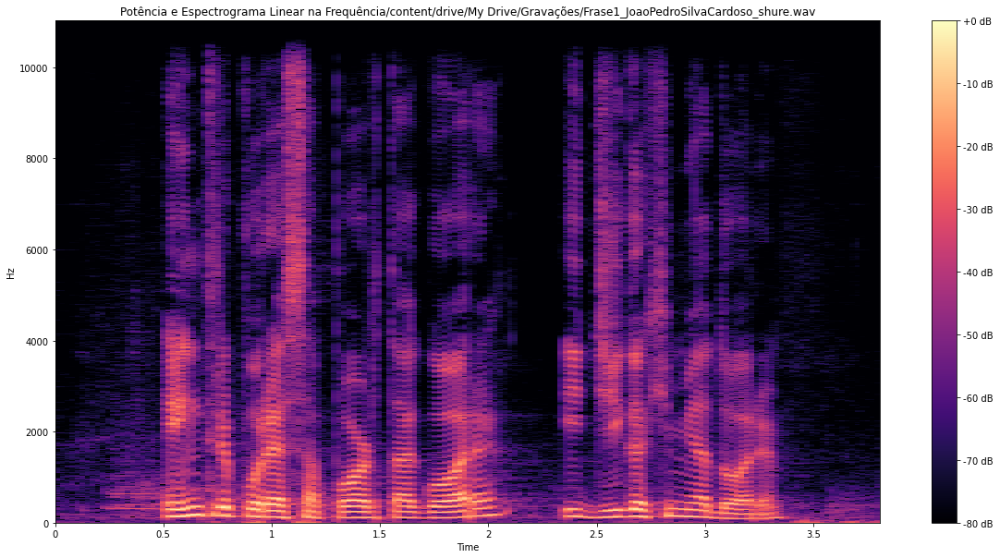

In [121]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(joao_vf_s)), ref=np.max)
fig, ax = plt.subplots(figsize=(20, 10))
librosa.display.specshow(D, x_axis='time',y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Potência e Espectrograma Linear na Frequência'+ joao_voz_falada)
plt.show()

#### 4.2.2.3 Voz declamada

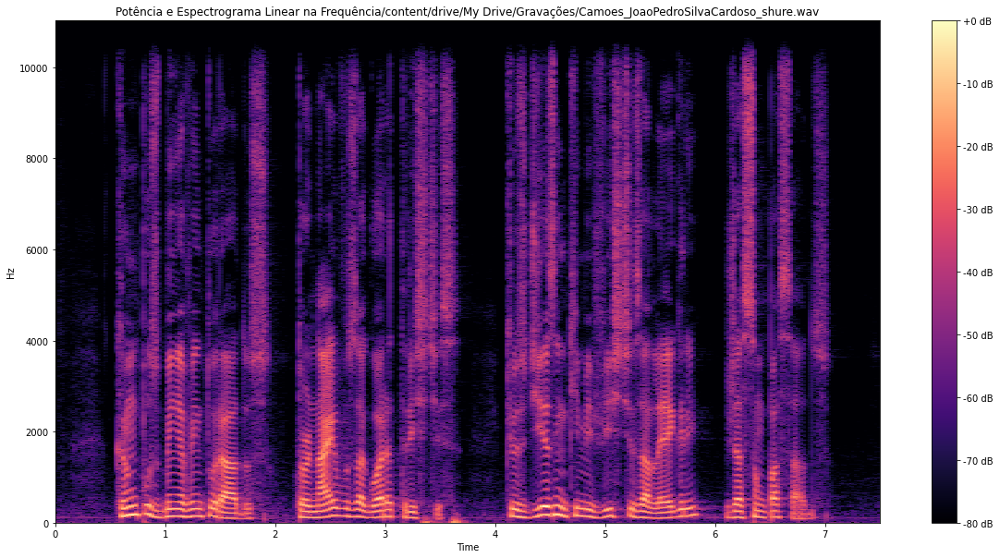

In [43]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(Joao_vd_s)), ref=np.max)
fig, ax = plt.subplots(figsize=(20, 10))
librosa.display.specshow(D, x_axis='time',y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Potência e Espectrograma Linear na Frequência'+ Joao_voz_declamada)
plt.show()

### 4.2.3 Marcelo

#### 4.2.3.1 Dígito

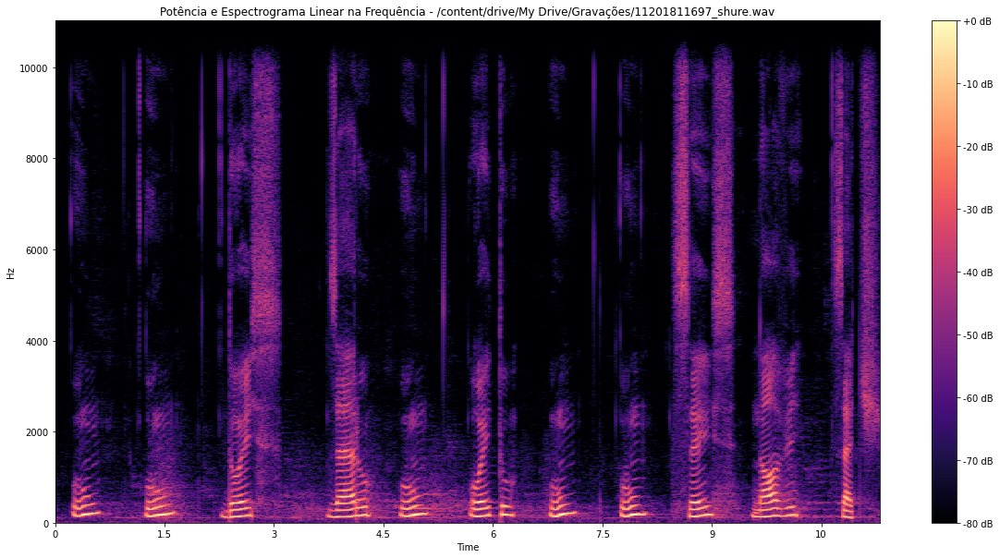

In [161]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(v1_marcelo_ra_behr)), ref=np.max)
fig, ax = plt.subplots(figsize=(20, 10))
librosa.display.specshow(D, x_axis='time',y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Potência e Espectrograma Linear na Frequência - '+ audio_marcelo_ra)
plt.show()

#### 4.2.3.2 Voz falada

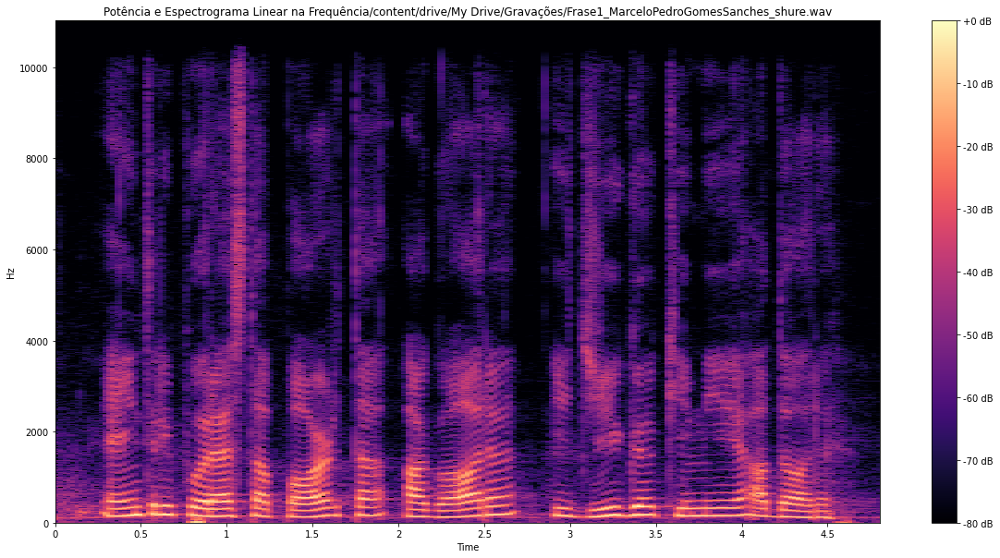

In [162]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(marcelo_vf_s)), ref=np.max)
fig, ax = plt.subplots(figsize=(20, 10))
librosa.display.specshow(D, x_axis='time',y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Potência e Espectrograma Linear na Frequência'+ marcelo_voz_falada)
plt.show()

#### 4.2.3.3 Voz declamada

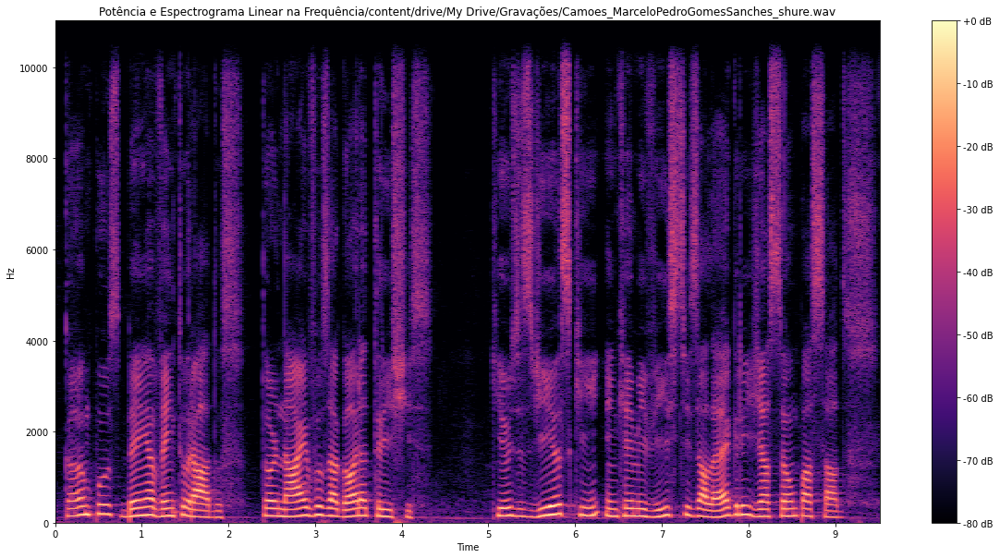

In [163]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(marcelo_vd_s)), ref=np.max)
fig, ax = plt.subplots(figsize=(20, 10))
librosa.display.specshow(D, x_axis='time',y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Potência e Espectrograma Linear na Frequência'+ marcelo_voz_declamada)
plt.show()

# 5. Determinação do Pitch e da F0

## 5.1 Exemplos

### 5.1.1 Pitch do Arquivo Teste1

In [54]:
# Segmente um fonema que tenha Pitch, p.ex "En" de "Entre"
v1En = v1[4000:16000]
IPython.display.Audio(data=v1En, rate=sr1)

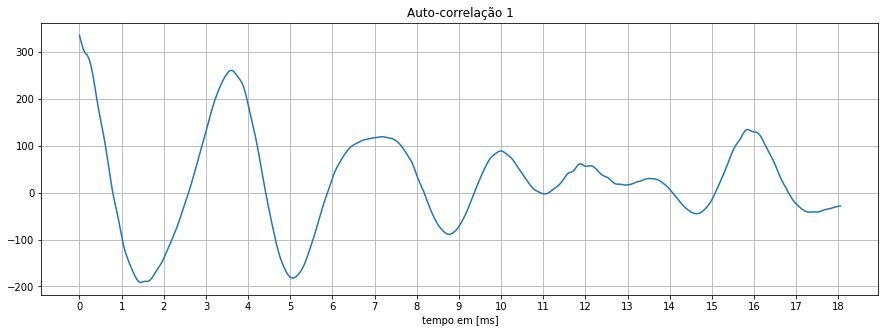

In [55]:
acEn = librosa.autocorrelate(v1En, max_size= sr1/32)
fig, ax = plt.subplots(figsize=(15, 5))
ax.xaxis.set_major_locator(MultipleLocator(1))
y1 = acEn[1:400]
x1 = range(len(y1))
xx = [i*1000/sr1 for i in x1]
plt.grid(True)
ax.plot(xx,y1)

plt.title('Auto-correlação 1')
plt.xlabel('tempo em [ms]')
plt.show()

### 5.1.2 Pitch do Arquivo Teste2

In [107]:
# Segmente outro fonema que tenha Pitch, p.ex "Ag" de "Agora"
v1A = v1[48000:56000]
IPython.display.Audio(data=v1A, rate=sr1)

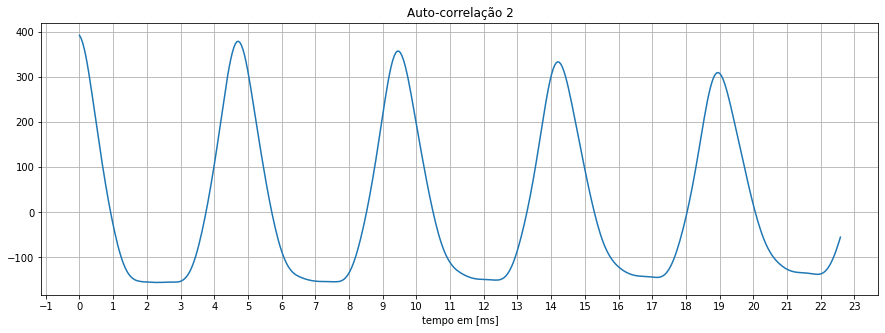

In [108]:
acA = librosa.autocorrelate(v1A, max_size= sr1/32)
fig, ax2 = plt.subplots(figsize=(15, 5))
ax2.xaxis.set_major_locator(MultipleLocator(1))
y2 = acA[1:500]
x2 = range(len(y2))
xx2 = [i*1000/sr1 for i in x2]
plt.grid(True)
ax2.plot(xx2,y2)

plt.title('Auto-correlação 2')
plt.xlabel('tempo em [ms]')
plt.show()

<h4> O Período de Pitch ($T_{0}$) é o intervalo entre picos sucessivos.<br>A Frequência Fundamental ($f_0$) é o inverso do periódo de Pitch.

#### Determine o Período de Pitch e a Fundamental desta vogal (Teste 2). 

Tempo do primeiro máximo:  4.716553287981859
Tempo do segundo máximo:  9.433106575963718

Período de pitch [ms]:  4.716553287981859
Frequência fundamental [Hz]:  212.0192307692308


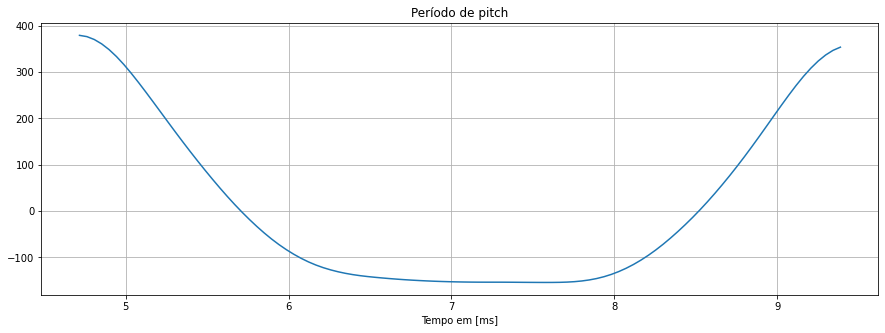

In [130]:
pos_primeiro_max = y2.tolist().index(max(y2[10:]))
print("Tempo do primeiro máximo: ",xx2[pos_primeiro_max])

pos_segundo_max = y2.tolist().index(max(y2[pos_primeiro_max+10:]))
print("Tempo do segundo máximo: ",xx2[pos_segundo_max])

pitch = xx2[pos_segundo_max]-xx2[pos_primeiro_max]
print("\nPeríodo de pitch [ms]: ",pitch)

fund=1/(pitch*0.001)
print("Frequência fundamental [Hz]: ", fund)

fig, ax2 = plt.subplots(figsize=(15, 5))
plt.grid(True)
ax2.plot(xx2[pos_primeiro_max:pos_segundo_max],y2[pos_primeiro_max:pos_segundo_max])

plt.title('Período de pitch')
plt.xlabel('Tempo em [ms]')
plt.show()

## 5.2 Agora com cada um dos seus arquivos: 
**Determine o Pitch e a $f_0$ das vogais que desejarem (três vogais diferentes) dos seus arquivos, para as versões:**
1. Dígitos
2. Falada
3. Declamada

### 5.2.1 Adinan

#### 5.2.1.1 Dígitos

In [235]:
# Segmente outro fonema que tenha Pitch, p.ex "Um"
v1_adinan_ra_ag = v1_adinan_ra[21000:28000]
IPython.display.Audio(data=v1_adinan_ra_ag, rate=sr1_adinan_ra)

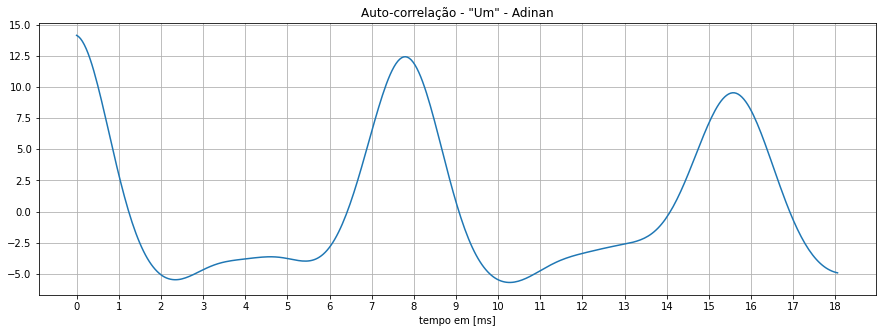


Período de pitch [ms]:  7.8
Frequência fundamental [Hz]:  128.198


In [236]:
acUm = librosa.autocorrelate(v1_adinan_ra_ag, max_size= sr1_adinan_ra/32)
fig, ax = plt.subplots(figsize=(15, 5))
ax.xaxis.set_major_locator(MultipleLocator(1))
y1 = acUm[1:400]
x1 = range(len(y1))
xx = [i*1000/sr1 for i in x1]
plt.grid(True)
ax.plot(xx,y1)

plt.title('Auto-correlação - "Um" - Adinan')
plt.xlabel('tempo em [ms]')
plt.show()


# Cálculo do pitch e frequencia fundamental:

pos_primeiro_max = y1.tolist().index(max(y1[15:]))

pitch = xx[pos_primeiro_max]
print("\nPeríodo de pitch [ms]: ",round(pitch,3))

fund=1/(pitch*0.001)
print("Frequência fundamental [Hz]: ", round(fund,3))

#### 5.2.1.2 Voz falada

In [232]:
# Segmente outro fonema que tenha Pitch, p.ex "Um"
adinan_vf_agora = adinan_vf_s[9000:14000]
IPython.display.Audio(data=adinan_vf_agora, rate=adinan_vf_s_sr1)

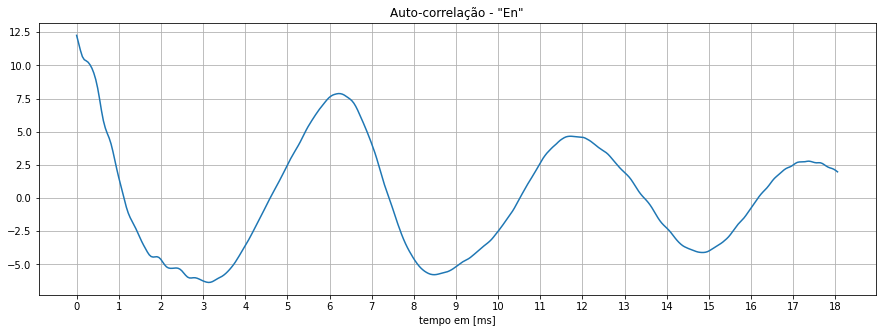


Período de pitch [ms]:  6.213
Frequência fundamental [Hz]:  160.949


In [234]:
acEn_ad = librosa.autocorrelate(adinan_vf_agora, max_size= adinan_vf_s_sr1/32)
fig, ax = plt.subplots(figsize=(15, 5))
ax.xaxis.set_major_locator(MultipleLocator(1))
y1 = acEn_ad[1:400]
x1 = range(len(y1))
xx = [i*1000/sr1 for i in x1]
plt.grid(True)
ax.plot(xx,y1)

plt.title('Auto-correlação - "En" - Adinan')
plt.xlabel('tempo em [ms]')
plt.show()


# Cálculo do pitch e frequencia fundamental:

pos_primeiro_max = y1.tolist().index(max(y1[15:]))

pitch = xx[pos_primeiro_max]
print("\nPeríodo de pitch [ms]: ",round(pitch,3))

fund=1/(pitch*0.001)
print("Frequência fundamental [Hz]: ", round(fund,3))

#### 5.2.1.3 Voz declamada

In [299]:
# Segmente outro fonema que tenha Pitch, p.ex "passAdos"
adinan_vd_pitch = adinan_vd_s[34000:37000]
IPython.display.Audio(data=adinan_vd_pitch, rate=adinan_vd_s_sr1)

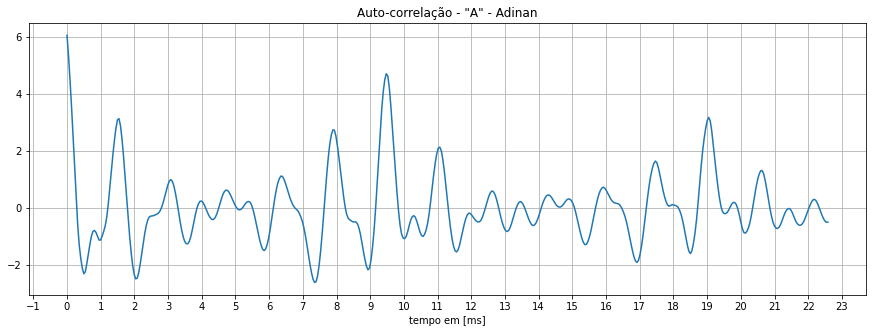


Período de pitch [ms]:  9.478
Frequência fundamental [Hz]:  105.502


In [300]:
ac_cam_ad = librosa.autocorrelate(adinan_vd_pitch, max_size= adinan_vd_s_sr1/32)
fig, ax = plt.subplots(figsize=(15, 5))
ax.xaxis.set_major_locator(MultipleLocator(1))
y1 = ac_cam_ad[1:500]
x1 = range(len(y1))
xx = [i*1000/sr1 for i in x1]
plt.grid(True)
ax.plot(xx,y1)

plt.title('Auto-correlação - "A" - Adinan')
plt.xlabel('tempo em [ms]')
plt.show()


# Cálculo do pitch e frequencia fundamental:

pos_primeiro_max = y1.tolist().index(max(y1[15:]))

pitch = xx[pos_primeiro_max]
print("\nPeríodo de pitch [ms]: ",round(pitch,3))

fund=1/(pitch*0.001)
print("Frequência fundamental [Hz]: ", round(fund,3))

### 5.2.2 João

#### 5.2.2.1 Dígitos

In [265]:
# Segmente outro fonema que tenha Pitch, p.ex "Ag" de "Agora"
joao_dig_pitch = v1_joao_ra_behr[14000:20000]
IPython.display.Audio(data=joao_dig_pitch, rate=sr1_joao_ra_behr)

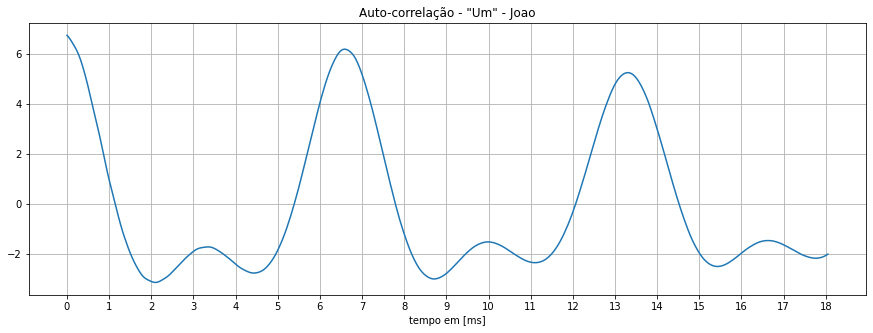


Período de pitch [ms]:  6.576
Frequência fundamental [Hz]:  152.069


In [266]:
acUm_joao = librosa.autocorrelate(joao_dig_pitch, max_size= sr1_joao_ra_behr/32)
fig, ax = plt.subplots(figsize=(15, 5))
ax.xaxis.set_major_locator(MultipleLocator(1))
y1 = acUm_joao[1:400]
x1 = range(len(y1))
xx = [i*1000/sr1 for i in x1]
plt.grid(True)
ax.plot(xx,y1)

plt.title('Auto-correlação - "Um" - João')
plt.xlabel('tempo em [ms]')
plt.show()


# Cálculo do pitch e frequencia fundamental:

pos_primeiro_max = y1.tolist().index(max(y1[15:]))

pitch = xx[pos_primeiro_max]
print("\nPeríodo de pitch [ms]: ",round(pitch,3))

fund=1/(pitch*0.001)
print("Frequência fundamental [Hz]: ", round(fund,3))

#### 5.2.2.2 Voz falada

In [277]:
# Segmente outro fonema que tenha Pitch, p.ex "Ag" de "Agora"
joao_vf_pitch = joao_vf_s[10500:15000]
IPython.display.Audio(data=joao_vf_pitch, rate=joao_vf_s_sr1)

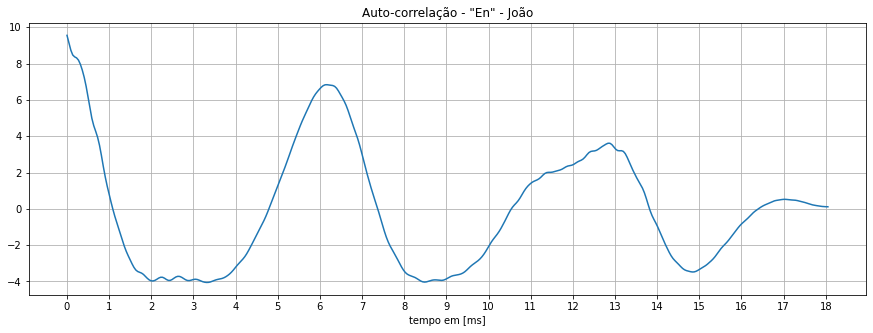


Período de pitch [ms]:  6.168
Frequência fundamental [Hz]:  162.132


In [278]:
acEn_joao = librosa.autocorrelate(joao_vf_pitch, max_size= joao_vf_s_sr1/32)
fig, ax = plt.subplots(figsize=(15, 5))
ax.xaxis.set_major_locator(MultipleLocator(1))
y1 = acEn_joao[1:400]
x1 = range(len(y1))
xx = [i*1000/sr1 for i in x1]
plt.grid(True)
ax.plot(xx,y1)

plt.title('Auto-correlação - "En" - João')
plt.xlabel('tempo em [ms]')
plt.show()


# Cálculo do pitch e frequencia fundamental:

pos_primeiro_max = y1.tolist().index(max(y1[15:]))

pitch = xx[pos_primeiro_max]
print("\nPeríodo de pitch [ms]: ",round(pitch,3))

fund=1/(pitch*0.001)
print("Frequência fundamental [Hz]: ", round(fund,3))

#### 5.2.2.3 Voz declamada

In [301]:
# Segmente outro fonema que tenha Pitch, p.ex "passAdos"
joao_vd_pitch = Joao_vd_s[34000:37000]
IPython.display.Audio(data=joao_vd_pitch, rate=Joao_vd_s_sr1)

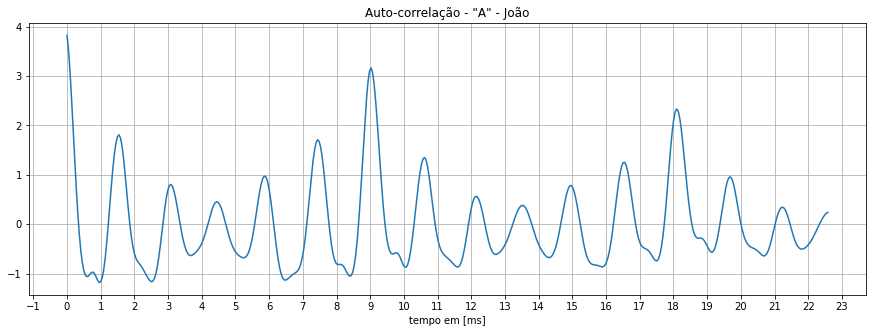


Período de pitch [ms]:  9.025
Frequência fundamental [Hz]:  110.804


In [302]:
ac_dec_joao = librosa.autocorrelate(joao_vd_pitch, max_size= Joao_vd_s_sr1/32)
fig, ax = plt.subplots(figsize=(15, 5))
ax.xaxis.set_major_locator(MultipleLocator(1))
y1 = ac_dec_joao[1:500]
x1 = range(len(y1))
xx = [i*1000/sr1 for i in x1]
plt.grid(True)
ax.plot(xx,y1)

plt.title('Auto-correlação - "A" - João')
plt.xlabel('tempo em [ms]')
plt.show()


# Cálculo do pitch e frequencia fundamental:

pos_primeiro_max = y1.tolist().index(max(y1[15:]))

pitch = xx[pos_primeiro_max]
print("\nPeríodo de pitch [ms]: ",round(pitch,3))

fund=1/(pitch*0.001)
print("Frequência fundamental [Hz]: ", round(fund,3))

### 5.2.3 Marcelo

#### 5.2.3.1 Dígitos

In [309]:
# Segmente outro fonema que tenha Pitch, p.ex "Um"
marcelo_dig_pitch = v1_marcelo_ra_behr[5000:14000]
IPython.display.Audio(data=marcelo_dig_pitch, rate=sr1_marcelo_ra_behr)

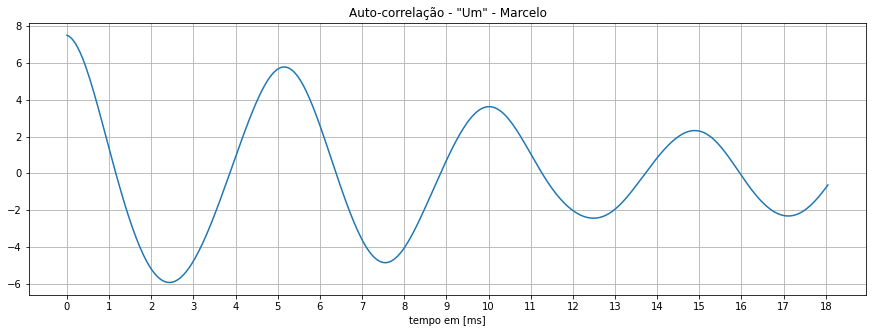


Período de pitch [ms]:  5.17
Frequência fundamental [Hz]:  193.421


In [311]:
acUm_marcelo = librosa.autocorrelate(marcelo_dig_pitch, max_size= sr1_marcelo_ra_behr/32)
fig, ax = plt.subplots(figsize=(15, 5))
ax.xaxis.set_major_locator(MultipleLocator(1))
y1 = acUm_marcelo[1:400]
x1 = range(len(y1))
xx = [i*1000/sr1 for i in x1]
plt.grid(True)
ax.plot(xx,y1)

plt.title('Auto-correlação - "Um" - Marcelo')
plt.xlabel('tempo em [ms]')
plt.show()


# Cálculo do pitch e frequencia fundamental:

pos_primeiro_max = y1.tolist().index(max(y1[15:]))

pitch = xx[pos_primeiro_max]
print("\nPeríodo de pitch [ms]: ",round(pitch,3))

fund=1/(pitch*0.001)
print("Frequência fundamental [Hz]: ", round(fund,3))

#### 5.2.3.2 Voz falada

In [322]:
# Segmente outro fonema que tenha Pitch, p.ex "En" de "Entre"
marcelo_vf_pitch = marcelo_vf_s[5500:10500]
IPython.display.Audio(data=marcelo_vf_pitch, rate=marcelo_vf_s_sr1)

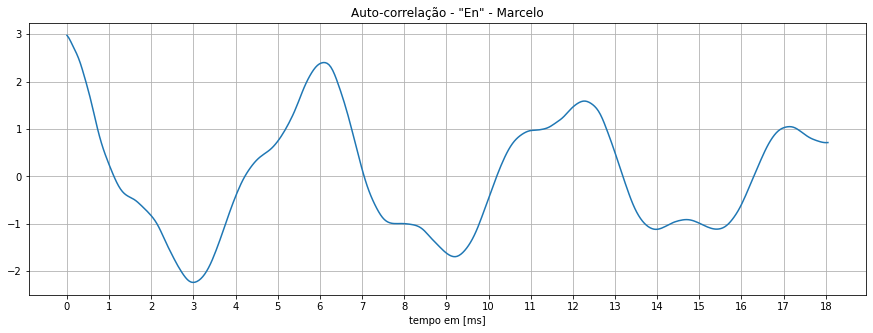


Período de pitch [ms]:  6.077
Frequência fundamental [Hz]:  164.552


In [323]:
acEn_marcelo = librosa.autocorrelate(marcelo_vf_pitch, max_size= marcelo_vf_s_sr1/32)
fig, ax = plt.subplots(figsize=(15, 5))
ax.xaxis.set_major_locator(MultipleLocator(1))
y1 = acEn_marcelo[1:400]
x1 = range(len(y1))
xx = [i*1000/sr1 for i in x1]
plt.grid(True)
ax.plot(xx,y1)

plt.title('Auto-correlação - "En" - Marcelo')
plt.xlabel('tempo em [ms]')
plt.show()


# Cálculo do pitch e frequencia fundamental:

pos_primeiro_max = y1.tolist().index(max(y1[15:]))

pitch = xx[pos_primeiro_max]
print("\nPeríodo de pitch [ms]: ",round(pitch,3))

fund=1/(pitch*0.001)
print("Frequência fundamental [Hz]: ", round(fund,3))

#### 5.2.3.3 Voz declamada

In [335]:
# Segmente outro fonema que tenha Pitch, p.ex "passAdos"
marcelo_vd_pitch = marcelo_vd_s[35500:39000]
IPython.display.Audio(data=marcelo_vd_pitch, rate=marcelo_vd_s_sr1)

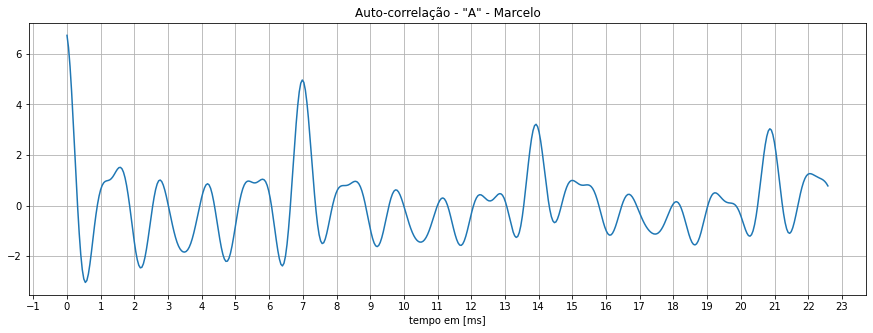


Período de pitch [ms]:  6.984
Frequência fundamental [Hz]:  143.182


In [336]:
ac_dec_marcelo = librosa.autocorrelate(marcelo_vd_pitch, max_size= marcelo_vd_s_sr1/32)
fig, ax = plt.subplots(figsize=(15, 5))
ax.xaxis.set_major_locator(MultipleLocator(1))
y1 = ac_dec_marcelo[1:500]
x1 = range(len(y1))
xx = [i*1000/sr1 for i in x1]
plt.grid(True)
ax.plot(xx,y1)

plt.title('Auto-correlação - "A" - Marcelo')
plt.xlabel('tempo em [ms]')
plt.show()


# Cálculo do pitch e frequencia fundamental:

pos_primeiro_max = y1.tolist().index(max(y1[15:]))

pitch = xx[pos_primeiro_max]
print("\nPeríodo de pitch [ms]: ",round(pitch,3))

fund=1/(pitch*0.001)
print("Frequência fundamental [Hz]: ", round(fund,3))

## 5.3 Determinação das Formantes 

#### 5.3.1 Formantes do trecho de teste

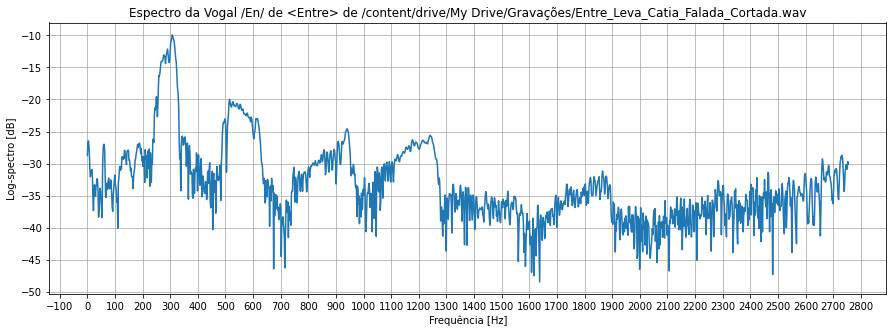

In [164]:
# AUDIO DE "En" em v1En
f, Pxx_spec = signal.periodogram(v1En, fa, 'flattop', scaling='spectrum')
lf = len(f)
fig, AX = plt.subplots(figsize=(15, 5))
AX.xaxis.set_major_locator(MultipleLocator(100))
AX.plot(f[:int(lf/4)], 10*np.log10(np.sqrt(Pxx_spec[:int(lf/4)])))
plt.xlabel('Frequência [Hz]')
plt.ylabel('Log-spectro [dB]')
plt.title('Espectro da Vogal /En/ de <Entre> de '+audio1)
plt.grid(True)
plt.show()


Os quatro primeros picos no espectro são as formantes $f_1$ a $f_4$

### 5.4 Agora com seus arquivos
Determine as formantes das vogais dos arquivos que vocês calcularam os espectrogramas

### 5.4.1 Adinan

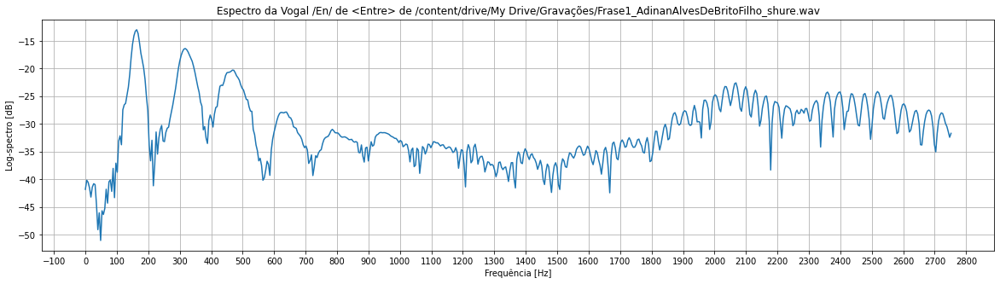

In [353]:
# AUDIO DE "En"

f, Pxx_spec = signal.periodogram(adinan_vf_agora, 22050, 'flattop', scaling='spectrum')
lf = len(f)
fig, AX = plt.subplots(figsize=(20, 5))
AX.xaxis.set_major_locator(MultipleLocator(100))
AX.plot(f[:int(lf/4)], 10*np.log10(np.sqrt(Pxx_spec[:int(lf/4)])))
plt.xlabel('Frequência [Hz]')
plt.ylabel('Log-spectro [dB]')
plt.title('Espectro da Vogal /En/ de <Entre> de '+adinan_voz_falada)
plt.grid(True)
plt.show()


### 5.4.2 João

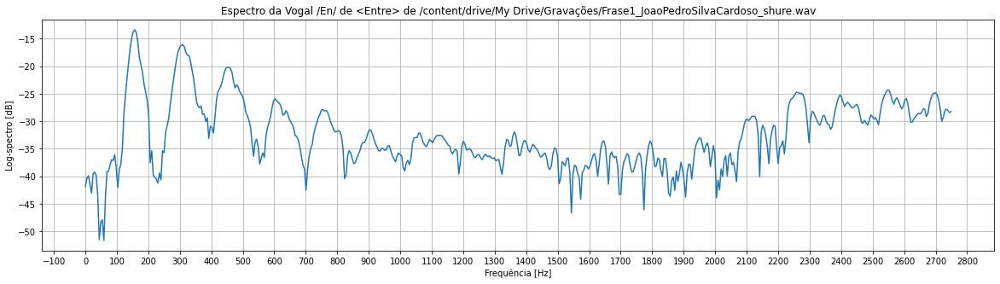

In [352]:
# AUDIO DE "En"

f, Pxx_spec = signal.periodogram(joao_vf_pitch, 22050, 'flattop', scaling='spectrum')
lf = len(f)
fig, AX = plt.subplots(figsize=(20, 5))
AX.xaxis.set_major_locator(MultipleLocator(100))
AX.plot(f[:int(lf/4)], 10*np.log10(np.sqrt(Pxx_spec[:int(lf/4)])))
plt.xlabel('Frequência [Hz]')
plt.ylabel('Log-spectro [dB]')
plt.title('Espectro da Vogal /En/ de <Entre> de '+joao_voz_falada)
plt.grid(True)
plt.show()


### 5.4.3 Marcelo

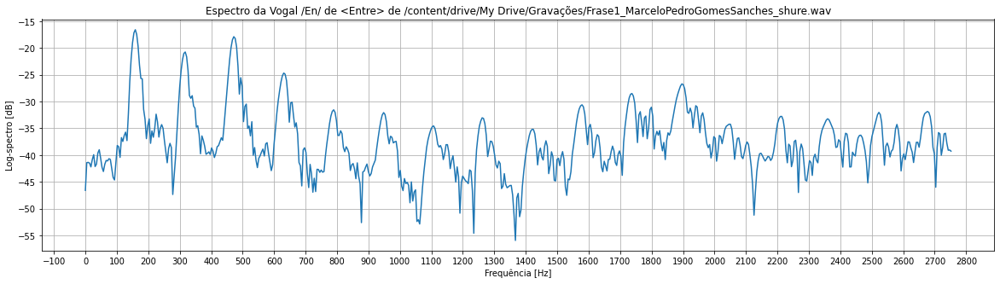

In [351]:
# AUDIO DE "En"

f, Pxx_spec = signal.periodogram(marcelo_vf_pitch, 22050, 'flattop', scaling='spectrum')
lf = len(f)
fig, AX = plt.subplots(figsize=(20, 5))
AX.xaxis.set_major_locator(MultipleLocator(100))
AX.plot(f[:int(lf/4)], 10*np.log10(np.sqrt(Pxx_spec[:int(lf/4)])))
plt.xlabel('Frequência [Hz]')
plt.ylabel('Log-spectro [dB]')
plt.title('Espectro da Vogal /En/ de <Entre> de '+marcelo_voz_falada)
plt.grid(True)
plt.show()


## 6. Determinação de Consoantes e Plosivos

Usando alguns de seus arquivos, no espectrograma, determine algumas consoantes surdas (p.ex. /s/ e /f/), surdas plosivas (p.ex. /p/, /t/ ou /k/) e sonoras (p.ex. (/b/, /v/, /g/, /m/, /nh/ e /lh/). Destaque circundando-as no espectrograma.

# 7. RELATÓRIO, parte do COLAB

* A áudio descrição pode ser mais simplificada, pois neste Lab são muitos os arquivos de áudio.  
* Na página do Laboratório (LEMBREM-SE que os notebooks são ANEXOS, e não páginas html), incluir os arquivos de voz de cada um dos integrantes.
*   Fazer uma tabela com todos os valores de pitch e $f_0$ de todos os integrantes, de acordo com o item 5.2., e comparem-nas.
* Escolher um conjunto de formantes ($f_1$ a $f_4$) de cada integrante, para a mesma vogal, e comparem-nas.
* Fazer uma seção de **Comentários e Conclusões** incluindo a análise dos espectrogramas das consoantes.





---



|Falante||Tipo de fala||Fonema||Pitch [ms]||Freq. Fundamental [Hz]|
|-------||------------||------||----------||----------------------|
|Adinan||Dígito||"Um"||7.8||128.198|
|João||Dígito||"Um"||6.576||152.069|
|Marcelo||Dígito||"Um"||5.17||193.421|
|Adinan||Voz Falada||"En"||6.213||160.949|
|João||Voz Falada||"En"||6.168||162.132|
|Marcelo||Voz Falada||"En"||6.077||164.552|
|Adinan||Voz Declamada||"A"||9.478||105.502|
|João||Voz Declamada||"A"||9.025||110.804|
|Marcelo||Voz Declamada||"A"||6.984||143.182|